In [1]:
    import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import pickle
import cv2
import glob
import PIL
from skimage.feature import hog
from moviepy.editor import VideoFileClip
from model import Model
from keras.models import load_model
from utils import *
from lesson_functions import *
from pipeline import VehicleDetector 

%matplotlib inline

Using TensorFlow backend.


### Data

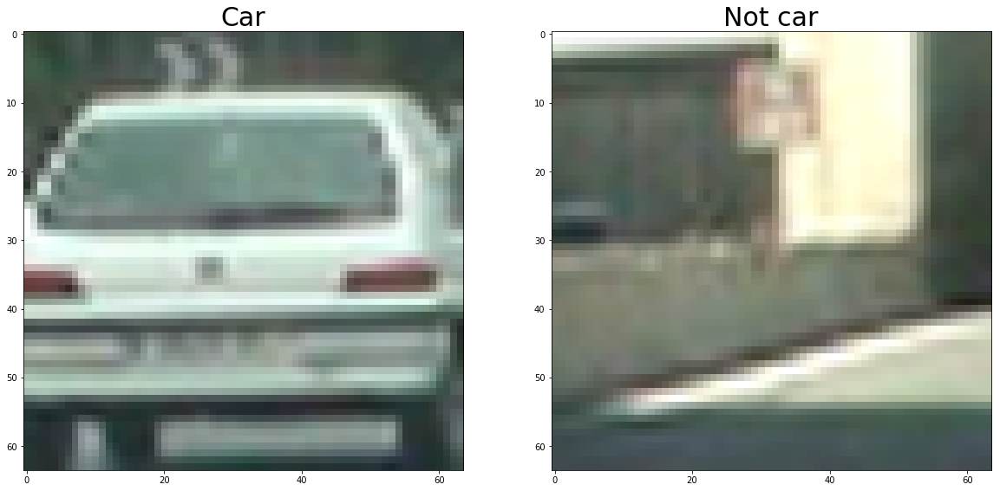

In [3]:
car     = mpimg.imread('vehicles/GTI_Far/image0840.png')
not_car = mpimg.imread('non-vehicles/GTI/image252.png')
                       
                       

font_size=30
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(car)
ax1.set_title('Car', fontsize=font_size)
ax2.imshow(not_car)
ax2.set_title('Not car', fontsize=font_size)
plt.rc('xtick', labelsize=font_size) 
plt.rc('ytick', labelsize=font_size) 

### Histogram of Oriented Gradients (HOG)

In [11]:
config = pickle.load( open("model.p", "rb" ) )
X_scaler = config["scaler"]
orient = config["orient"]
pix_per_cell = config["pix_per_cell"]
cell_per_block = config["cell_per_block"]
spatial_size = config["spatial_size"]
hist_bins = config["hist_bins"]
color_space= config['color_space']
hog_channel=config['hog_channel']
spatial_feat= config['spatial_feat']
hist_feat = config['hist_feat']
hog_feat = config['hog_feat']

conver_color = get_color_converter(color_space)

car     = conver_color(car)
not_car = conver_color(not_car)

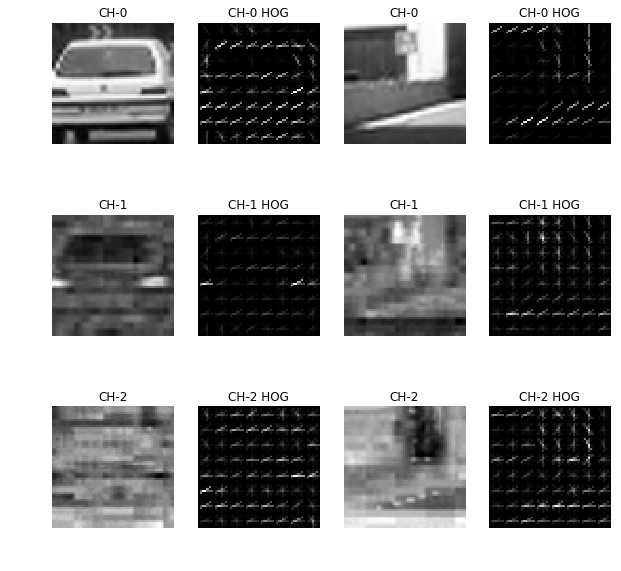

In [12]:
f, axs = plt.subplots(3, 4, figsize=(10,10))
axs = axs.ravel()

for ch in range(3):
    _, car_hog = get_hog_features(car[:,:,ch], orient, 
                                  pix_per_cell, cell_per_block, vis=True, feature_vec=True)
    _, not_car_hog = get_hog_features(not_car[:,:,ch], orient, 
                                      pix_per_cell, cell_per_block, vis=True, feature_vec=True)
    
    axs[ch*4].imshow(car[:,:,ch], cmap='gray')
    axs[ch*4].axis('off')
    axs[ch*4].set_title('CH-{}'.format(ch))
    
    axs[ch*4+1].imshow(car_hog, cmap='gray')
    axs[ch*4+1].axis('off')
    axs[ch*4+1].set_title('CH-{} HOG'.format(ch))
    
    axs[ch*4+2].imshow(not_car[:,:,ch], cmap='gray')
    axs[ch*4+2].axis('off')
    axs[ch*4+2].set_title('CH-{}'.format(ch))
    
    axs[ch*4+3].imshow(not_car_hog, cmap='gray')
    axs[ch*4+3].axis('off')
    axs[ch*4+3].set_title('CH-{} HOG'.format(ch))
    
    


### Sliding windows

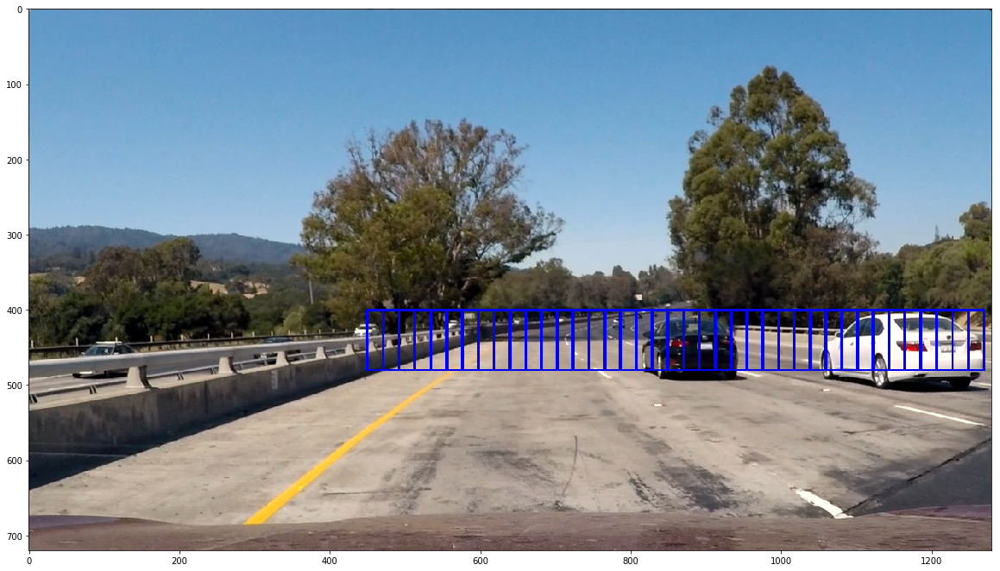

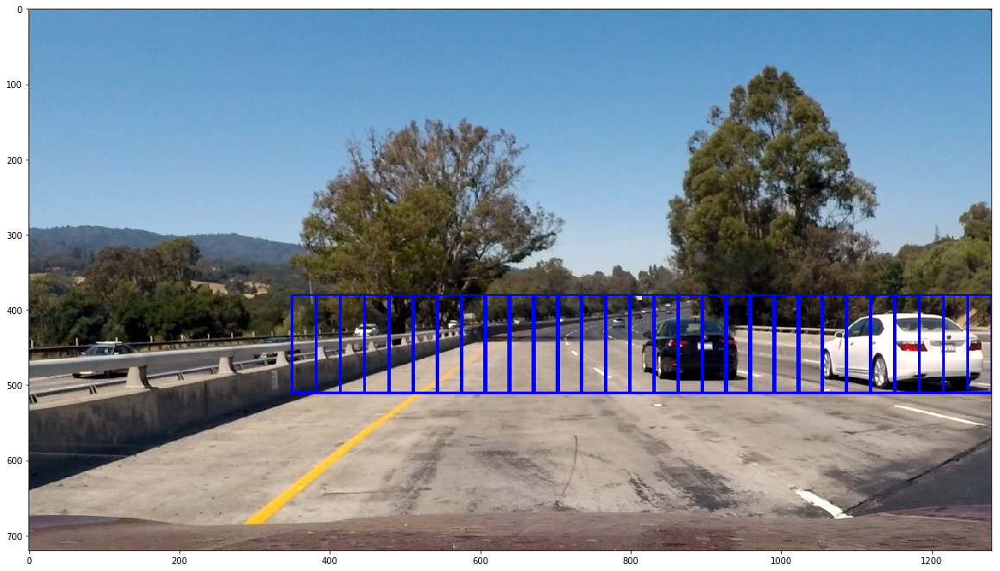

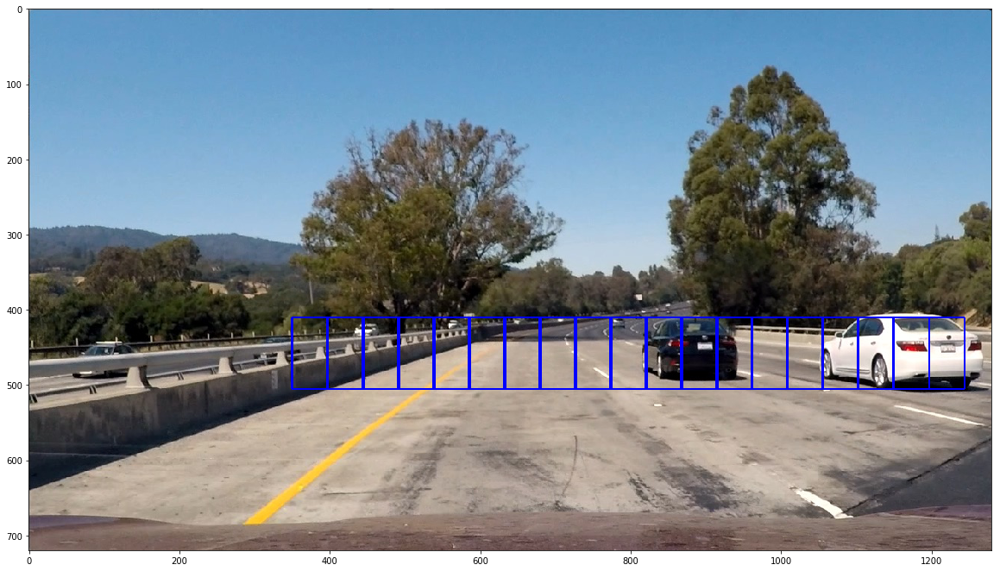

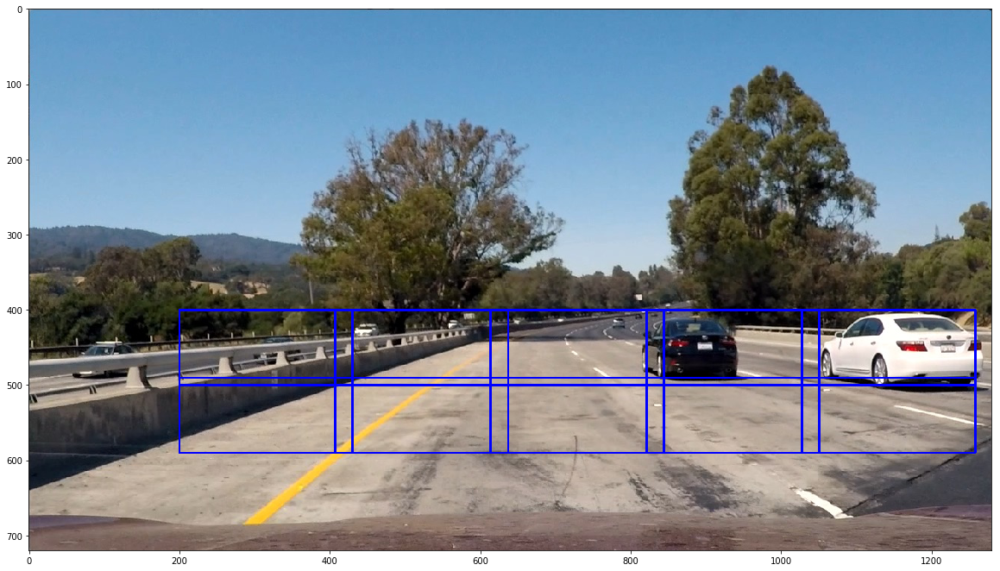

In [4]:
regions = [([450, None],[400,480],(85, 80), (0.75, 0.75)),
           ([350, None],[380,530], (130, 130), (0.75, 0.75)),
           ([350, None],[410,530],(95, 95), (0.5, 0.5)), 
           ([200, None],[400,600], (230, 100), (0.1, 0.1))]

image = mpimg.imread('./test_images/test1.jpg')

plt.rc('xtick', labelsize=10) 
plt.rc('ytick', labelsize=10) 


for x_start_stop, y_start_stop, xy_window, xy_overlap in regions:
    hot_windows = slide_window(image, x_start_stop=x_start_stop, y_start_stop=y_start_stop, 
                               xy_window=xy_window, xy_overlap=xy_overlap)

    window_img = draw_boxes(image, hot_windows, color=(0, 0, 255), thick=2)

    plt.figure(figsize=(20,20))
    plt.imshow(window_img)


In [14]:
images_files  = glob.glob('test_images/*.jpg')
clf           = load_model('clf.h5')
out_images    = []
boxes         = []
images        = []

for image_file in images_files:
    image   = mpimg.imread(image_file)
    windows = []
    
    images.append(image)
    for x_start_stop, y_start_stop, xy_window, xy_overlap in regions:
        hot_windows = slide_window(image, x_start_stop=x_start_stop, y_start_stop=y_start_stop, 
                               xy_window=xy_window, xy_overlap=xy_overlap)
        hot_windows = search_windows(image, hot_windows , clf, X_scaler, color_space=color_space, 
                                     spatial_size=spatial_size, hist_bins=hist_bins, 
                                     orient=orient, pix_per_cell=pix_per_cell, 
                                     cell_per_block=cell_per_block, 
                                     hog_channel=hog_channel, spatial_feat=spatial_feat, 
                                     hist_feat=hist_feat, hog_feat=hog_feat)
        windows.extend(hot_windows)
    boxes.append(windows)
    out_images.append( draw_boxes(image, windows, color=(0, 0, 255), thick=2)) 
        
    

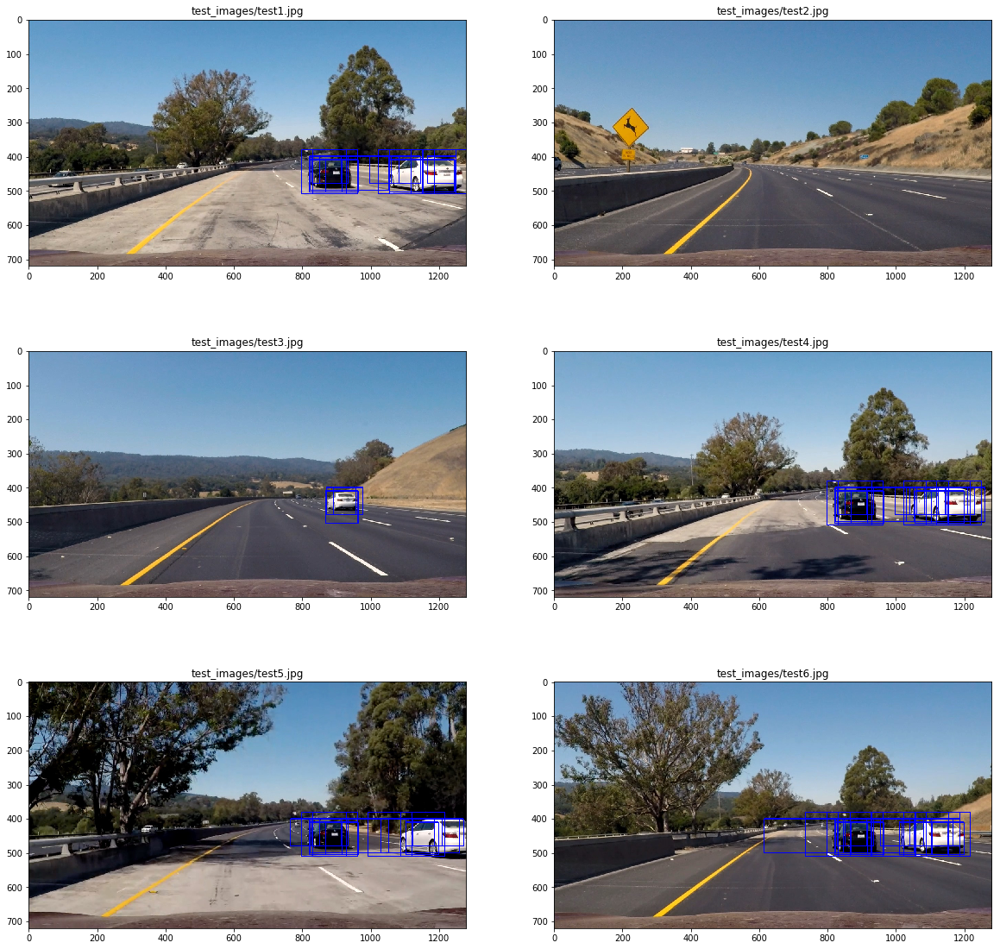

In [15]:
f, axs = plt.subplots(3, 2, figsize=(20,20))
axs = axs.ravel()

for idx, image in enumerate(out_images):
    axs[idx].imshow(image)
    axs[idx].set_title(images_files[idx])

### Heatmap

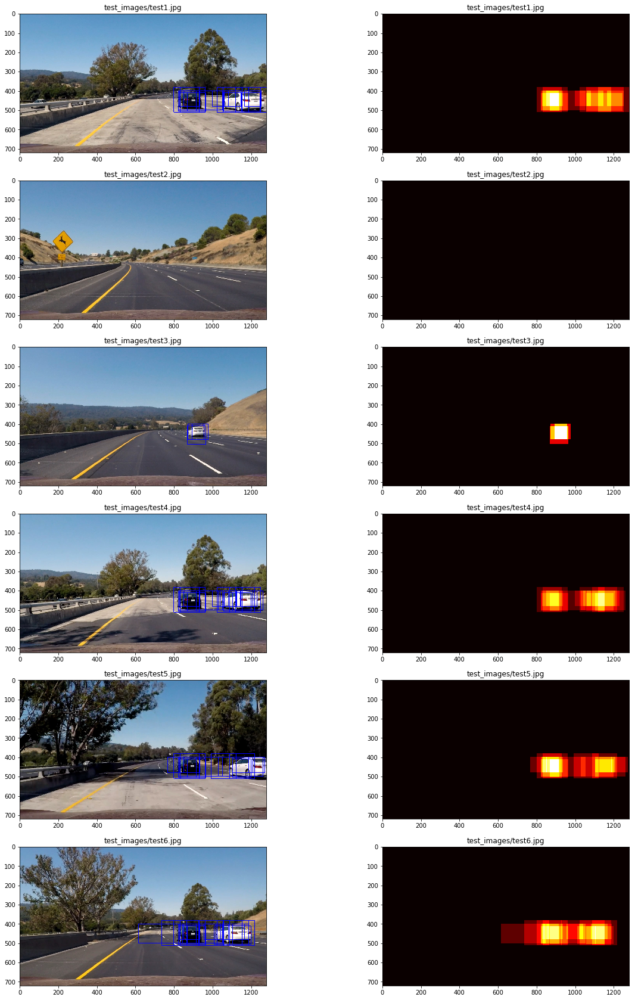

In [16]:
f, axs = plt.subplots(6, 2, figsize=(20,30))
axs = axs.ravel()

heatmaps = []

for idx, box_list in enumerate(boxes):
    image   = out_images[idx]
    file    = images_files[idx]
    heat    = np.zeros_like(image[:,:,0]).astype(np.float)
    heat    = add_heat(heat,box_list)
    heatmap = np.clip(heat, 0, 255)
    
    heatmaps.append(heat)
    
    axs[idx*2].imshow(image)
    axs[idx*2].set_title(file)
    
    axs[idx*2+1].imshow(heatmap, cmap='hot')
    axs[idx*2+1].set_title(file)
    

### Labels

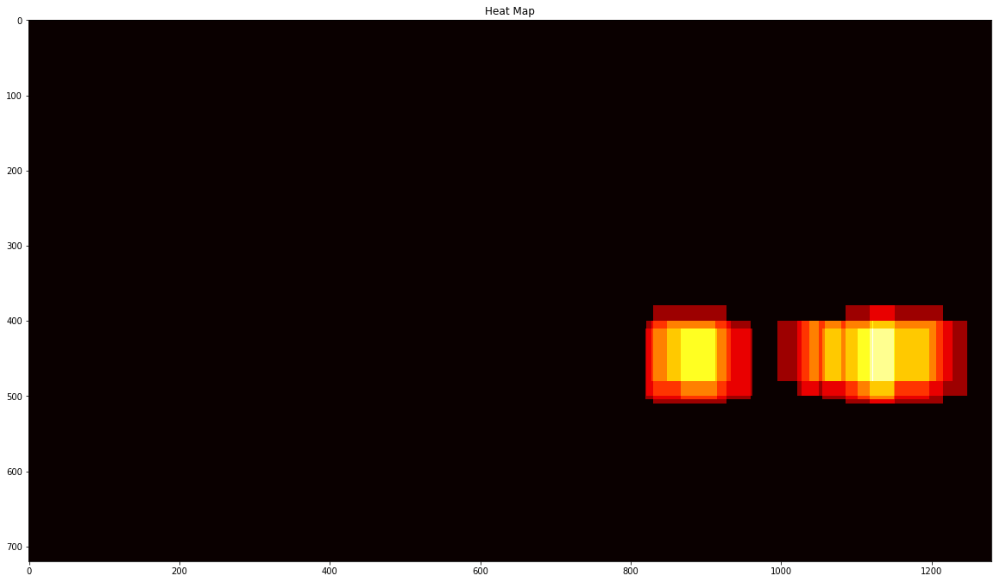

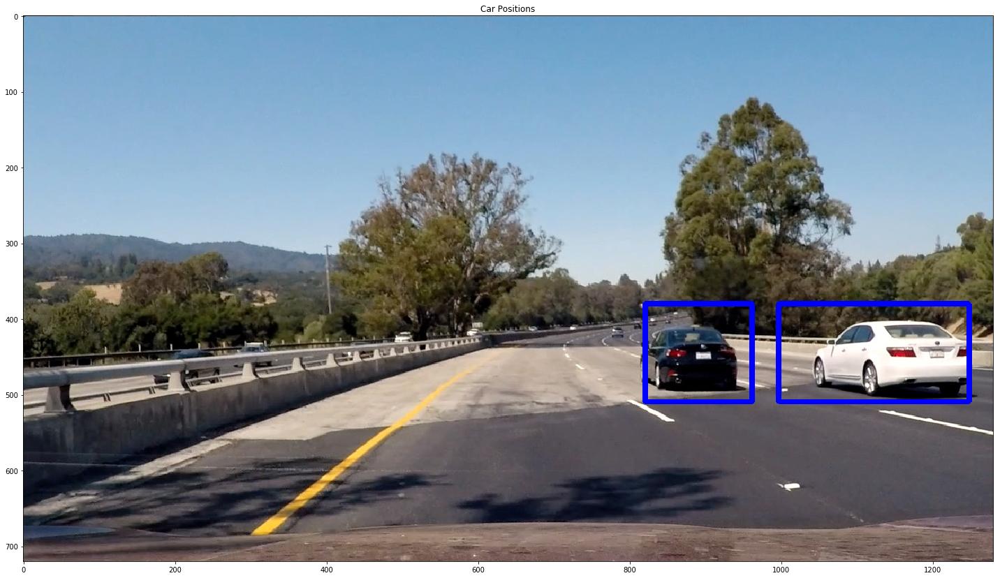

In [17]:
heat = apply_threshold(heatmaps[3],1)

# Visualize the heatmap when displaying    
heatmap = np.clip(heat, 0, 255)

# Find final boxes from heatmap using label function
labels = label(heat)
draw_img = draw_labeled_bboxes(np.copy(images[3]), labels)

fig = plt.figure(figsize=(20,20))
plt.imshow(heatmap, cmap='hot')
plt.title('Heat Map')
fig = plt.figure(figsize=(20,20))
plt.imshow(draw_img)
plt.title('Car Positions')
fig.tight_layout()


### Video

In [2]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

detector = VehicleDetector('model', threshold=1)
white_output = 'project_video_output.mp4'
clip = VideoFileClip("project_video.mp4")#.subclip(t_start=30,t_end=35)
white_clip = clip.fl_image(lambda frame: detector.mark_cars(frame))
%time white_clip.write_videofile(white_output, audio=False)

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [00:53<00:00, 23.36it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 49.1 s, sys: 5.14 s, total: 54.2 s
Wall time: 54.6 s
